# Metric comparison with expert asessment
## Dataset 2

Metric compuation procedure is described in [Metric for evaluating difference between seismograms](./Metrics_study_intro.ipynb)

In [8]:
import sys
sys.path.append('..')

import pandas as pd

from functools import reduce

from seismicpro.batchflow import Dataset
from seismicpro.src import SeismicBatch, FieldIndex

from utils import get_cv, draw_modifications_dist, validate_all, get_modifications_list

## Loading Data

In [9]:
base_path = '/datasets/Metric_study2/'
      
paths = {
    'lift': '2_human.sgy', 
    'raw': '1_raw.sgy',
    'm_1': '3_sup_bl.sgy',
    'm_2': '4_uns_bl.sgy',
}

field_index = reduce(lambda x, y: x.merge(y), 
                     (FieldIndex(name=name, path=base_path+path, extra_headers=['offset']) for name, path in paths.items()))


batch = (Dataset(field_index, SeismicBatch)
         .next_batch(len(field_index))
         .load(fmt='segy', components=tuple(paths.keys())))

cv = get_cv([batch.__getattr__(c)[0] for c in batch.components])
n_cols = 2

print("Number of fields: {}".format(len(field_index)))

Number of fields: 5


## Metrics calculation with lift as base

On all fields expert rate M_1 better than M_2

In [10]:
res = validate_all(batch)
df = pd.DataFrame(res)
df["agrees with experts"] = (df.M_1 < df.M_2) 
df

,LIFT,M_1,M_2,RAW,agrees with experts
0,0.0,1.670317e+09,1.879439e+09,5.203746e+11,True
1,0.0,1.782569e+09,1.605732e+11,4.820747e+11,True
2,0.0,1.577497e+09,1.698666e+09,5.211750e+11,True
3,0.0,1.613074e+09,1.839909e+09,3.397429e+11,True
4,0.0,1.824683e+09,1.755163e+09,6.031760e+11,False


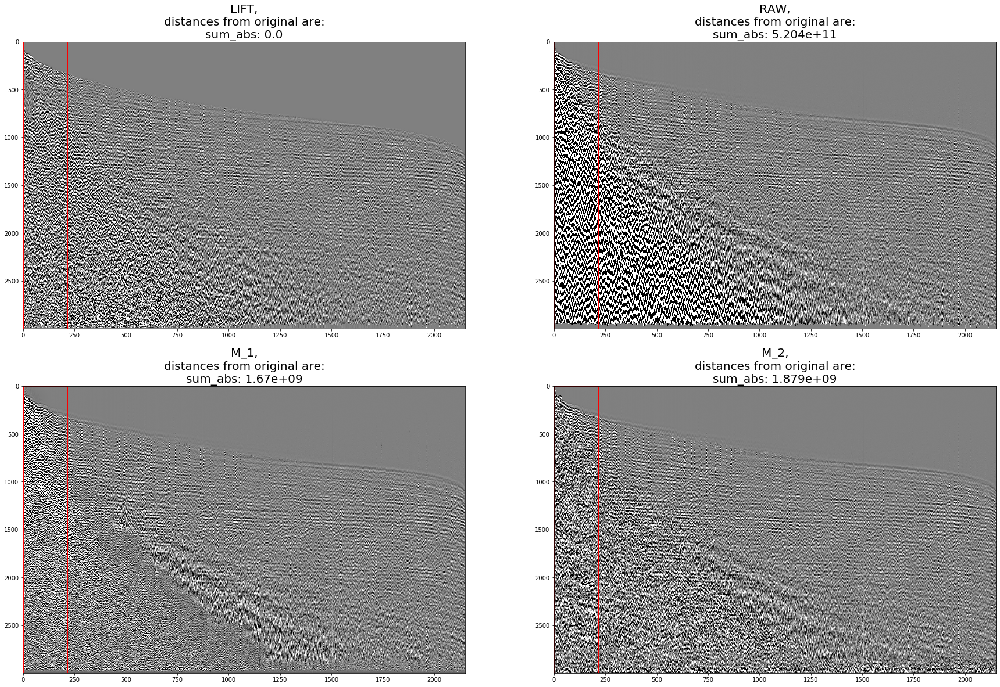

In [11]:
i=0
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

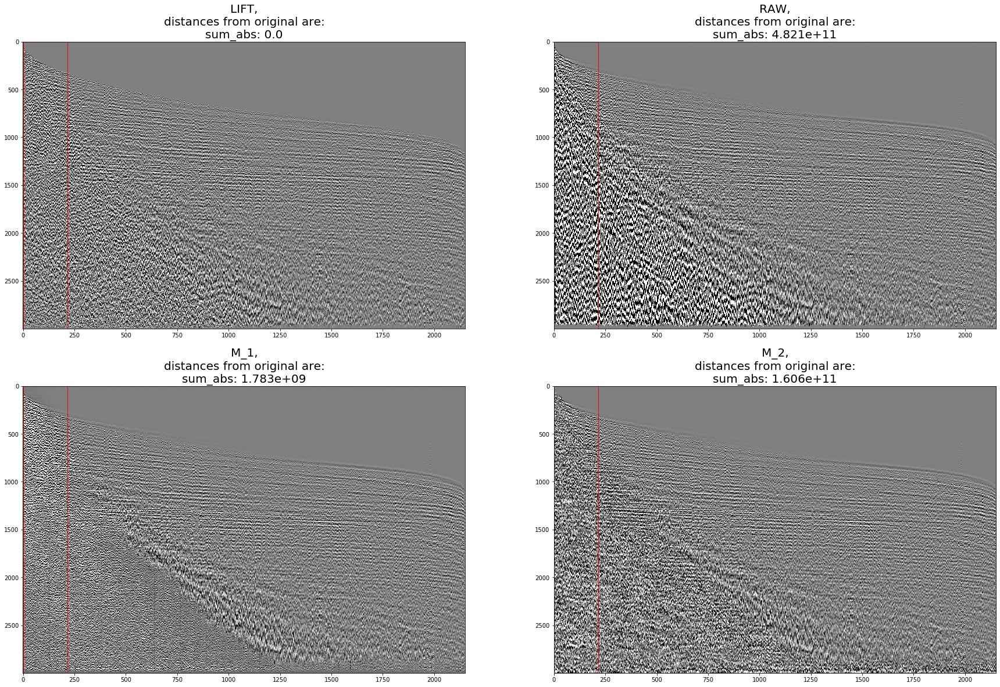

In [12]:
i=1
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

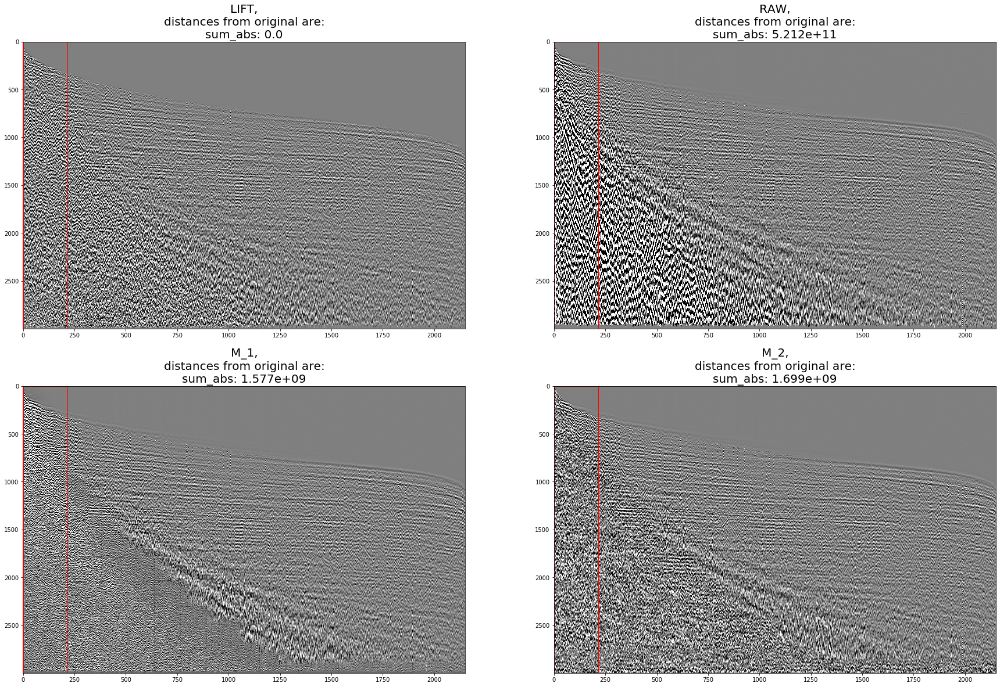

In [13]:
i=2
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

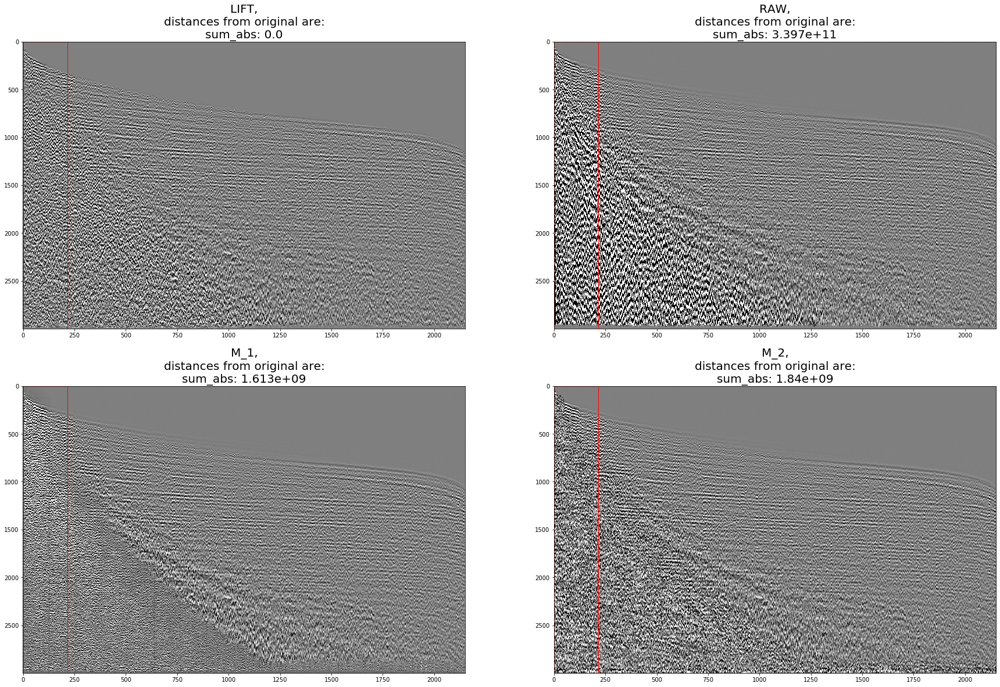

In [14]:
i=3
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

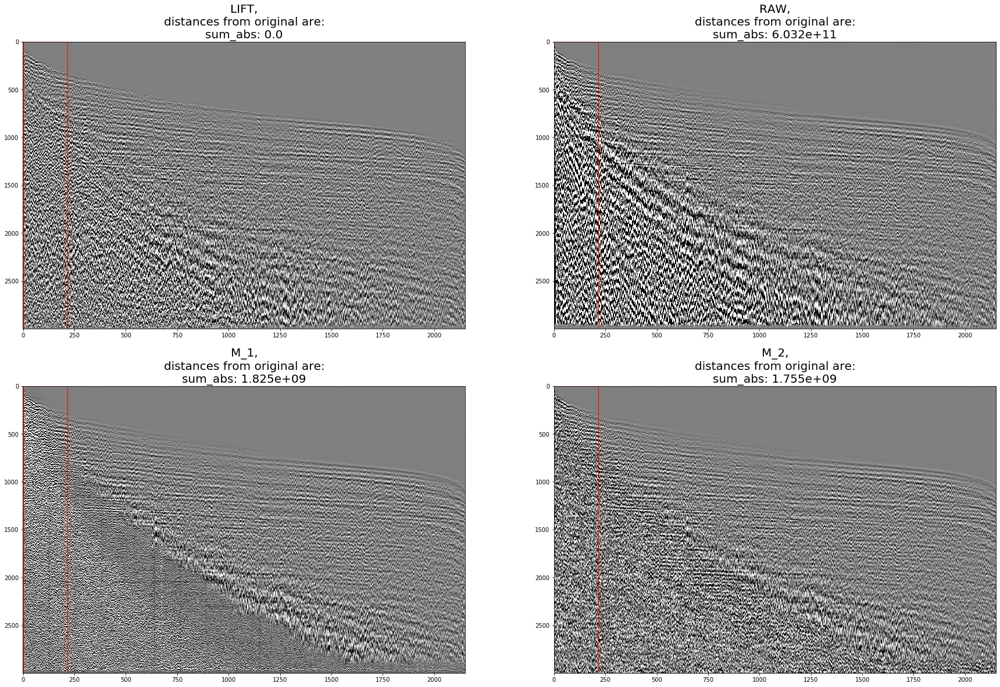

In [15]:
i=4
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')